# Create and Edit Images with gpt-image-1 on Azure OpenAI

Content:
1. Create images using a text prompt
2. Create images with a transparent background
3. Edit an input image using a text prompt
4. Compose a new image based on several input images
5. Mask-based inpainting

Resources:
- https://learn.microsoft.com/en-us/azure/ai-services/openai/how-to/dall-e?tabs=gpt-image-1
- https://platform.openai.com/docs/guides/image-generation?image-generation-model=gpt-image-1

## Setup

In [ ]:
import requests
import os
from dotenv import load_dotenv
from openai import AzureOpenAI

from utils import display_images

In [2]:
envpath = "../backend/.env"

if not load_dotenv(envpath): raise IOError("Error: .env file could not be loaded!")

imagegen_aoai_resource = os.getenv("IMAGEGEN_AOAI_RESOURCE")
imagegen_aoai_deployment = os.getenv("IMAGEGEN_DEPLOYMENT")
imagegen_aoai_api_key = os.getenv("IMAGEGEN_AOAI_API_KEY")

aoai_client = AzureOpenAI(
    azure_endpoint=f"https://{imagegen_aoai_resource}.openai.azure.com/",
    api_version="2025-04-01-preview",
    api_key=imagegen_aoai_api_key,
)

## Create images using a text prompt

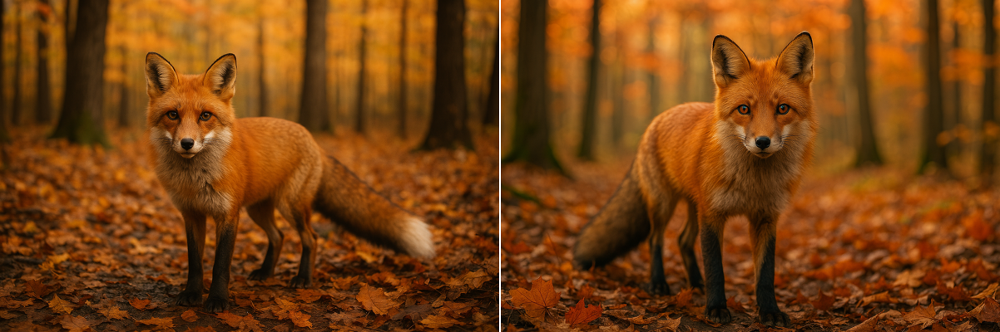

In [ ]:
result = aoai_client.images.generate(
    model="gpt-image-1",
    prompt="A photograph of a red fox in an autumn forest",
    n=2,
    quality="high",
    size="1536x1024", # 1024x1024, 1536x1024, 1024x1536
    output_format="png",
)

images_data = result.model_dump()["data"]
encoded_images = [img["b64_json"] for img in images_data]

display_images(encoded_images, width=600)

## Create images with a transparent background
Images with transparent backgrounds are useful because they allow seamless layering over different backgrounds without visible edges or unwanted color blocks. This makes them ideal for logos, icons, and UI elements where flexibility and clean integration are important. Additionally, PNG preserves image quality without compression artifacts.

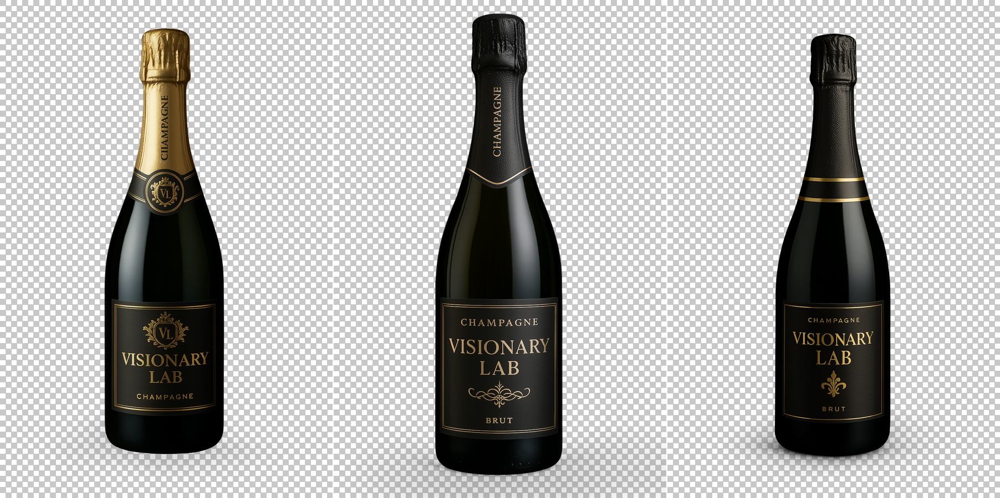

In [ ]:
prompt = "A commercial quality photograph of a premium bottle of champagne labeled 'Visionary Lab', standing upright. The bottle features a sleek, elegant label with gold accents."

result = aoai_client.images.generate(
    model="gpt-image-1",
    prompt=prompt,
    n=3,
    quality="high", # high, medium, low
    background="transparent", 
    size="1024x1536", # 1024x1024, 1536x1024, 1024x1536
)

images_data = result.model_dump()["data"]
encoded_images = [img["b64_json"] for img in images_data]

display_images(encoded_images, width=600)

## Edit an image using a text prompt
Edits are currently not supported with the OpenAI Python SDK when using Azure OpenAI. Therefore, we are switching to the REST API.

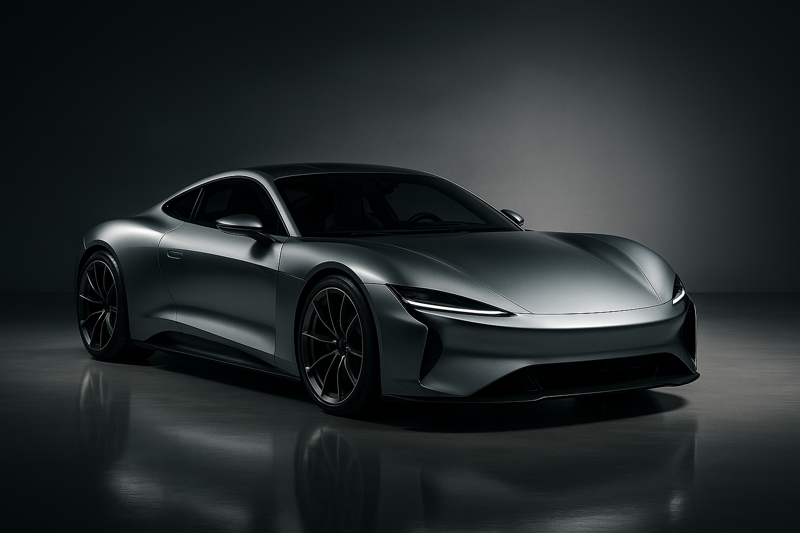

In [21]:
source_image = "images/sportive-car.png"
display_images(source_image, width=800)

In [ ]:
result = aoai_client.images.edit(
    model=imagegen_aoai_deployment,
    image=open(source_image, "rb"),
    prompt="make the car color metallic blue",
    n=1,
    size="1536x1024",
    quality="high", 
)

In [3]:
url = f"https://{imagegen_aoai_resource}.openai.azure.com/openai/deployments/{imagegen_aoai_deployment}/images/edits?api-version=2025-04-01-preview"

headers = {
    "api-key": imagegen_aoai_api_key
}

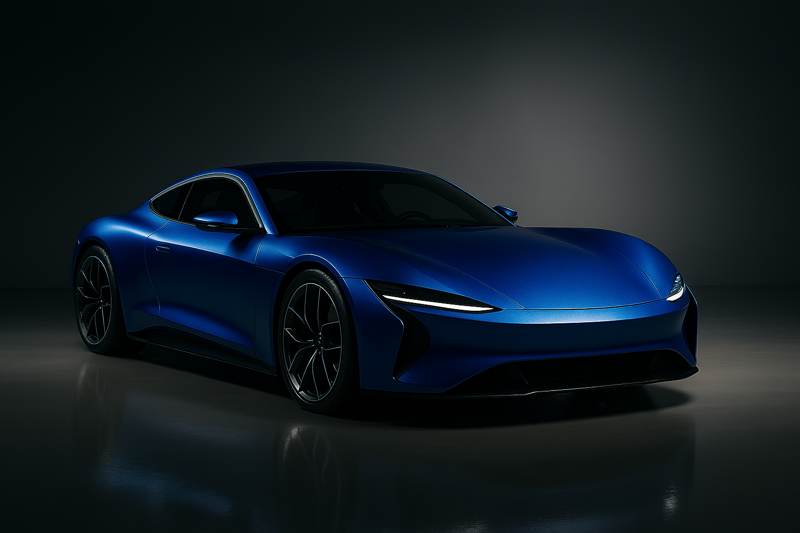

In [ ]:
files = {
    "image": open(source_image, "rb"),
}
data = {
    "prompt": "make the car color metallic blue",
    "n": 1,
    "size": "1536x1024",
    "quality": "high", # high, medium, low
}

# Send the request
response = requests.post(url, headers=headers, files=files, data=data)
response.raise_for_status()

images_data = response.json()["data"]
encoded_images = [img["b64_json"] for img in images_data]
display_images(encoded_images, width=800)

## Compose a new image based on several input images

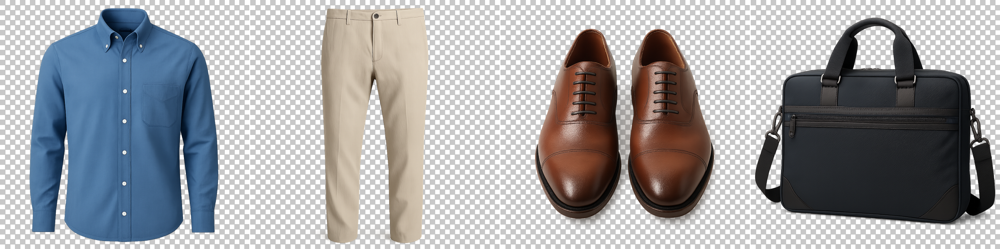

In [49]:
source_images = ["images/shirt.png", "images/trousers.png", "images/shoes.png", "images/briefcase.png"]
display_images(source_images, width=500)    

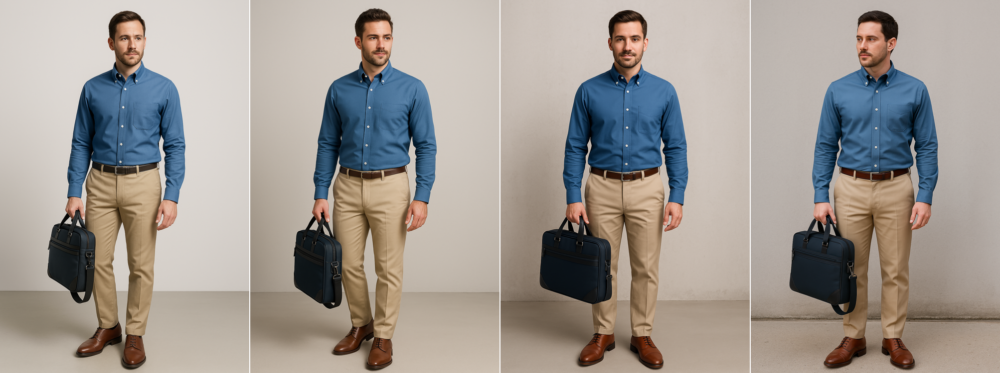

In [51]:
prompt = "Generate a photorealistic catalog image of a man wearing the four items in the reference pictures (shirt, trousers, shoes, briefcase)."

files = [("image[]", open(image, "rb")) for image in source_images]

data = {
    "prompt": prompt,
    "n": 4,
    "size": "1024x1536",
    "quality": "high",
}

response = requests.post(url, headers=headers, files=files, data=data)
response.raise_for_status()

images_data = response.json()["data"]
encoded_images = [img["b64_json"] for img in images_data]
display_images(encoded_images, width=500)

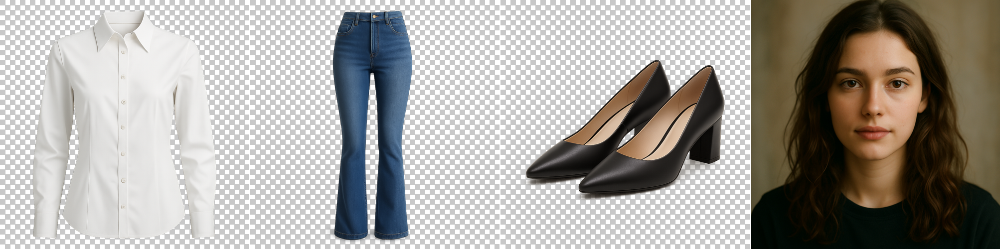

In [4]:
source_images = ["images/woman-shirt.png", "images/woman-jeans.png", "images/woman-shoes.png", "images/woman.png"]
display_images(source_images, width=500)    

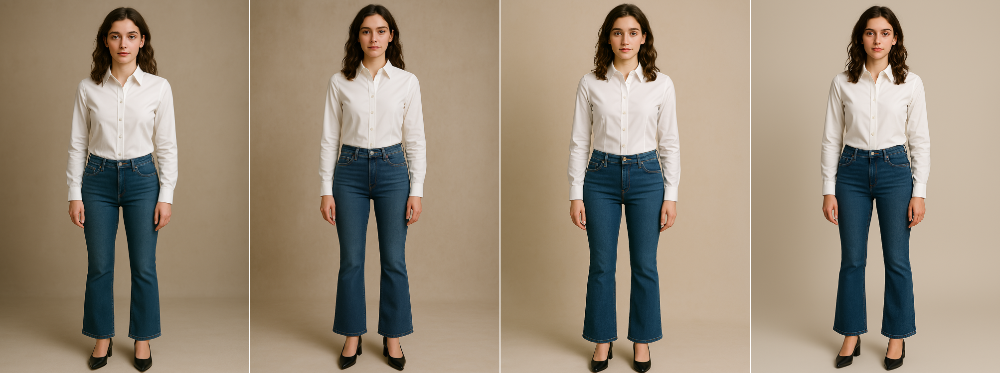

In [6]:
prompt = """
You are provided with four reference images:
1. A portrait photo of a woman.
2. Three catalog images showing a shirt, jeans, and shoes.

Task:
Generate a high-quality, photorealistic catalog image of the woman, dressed in the referenced shirt, jeans, and shoes. Ensure the final image looks natural, consistent, and suitable for fashion catalog presentation.
"""

files = [("image[]", open(image, "rb")) for image in source_images]

data = {
    "prompt": prompt,
    "n": 4,
    "size": "1024x1536",
    "quality": "high",
}

response = requests.post(url, headers=headers, files=files, data=data)
response.raise_for_status()

images_data = response.json()["data"]
encoded_images = [img["b64_json"] for img in images_data]
display_images(encoded_images, width=500)

## Mask-based inpainting

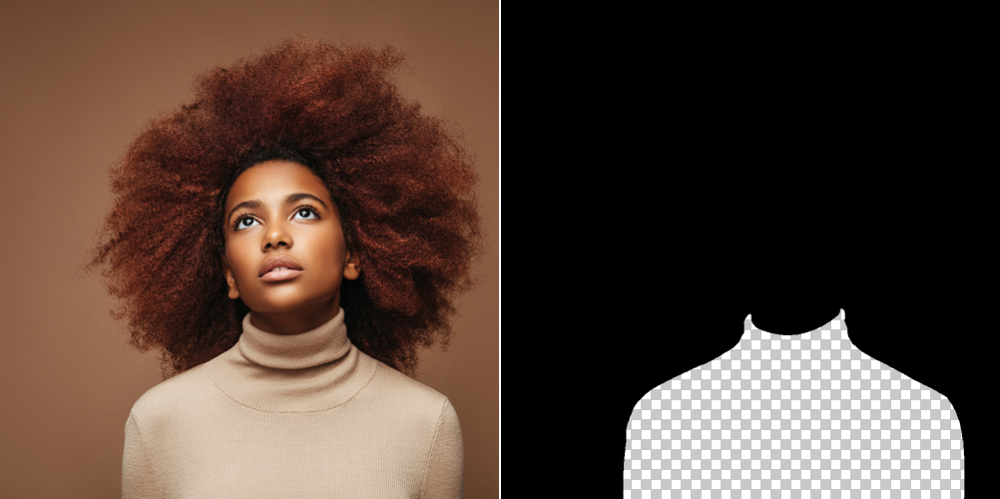

In [39]:
source_image = "images/no-smile.png"
mask_image = "images/mask.png"
display_images([source_image, mask_image], width=500)

In [44]:
files = {
    "image": open(source_image, "rb"),
    "mask": open(mask_image, "rb"),
}
data = {
    "prompt": "woman wearing a colorful polo shirt",
    "n": 2,
    "size": "1024x1024",
    "quality": "high", # high, medium, low
    "moderation": "low"
}

# Send the request
response = requests.post(url, headers=headers, files=files, data=data)
response.raise_for_status()

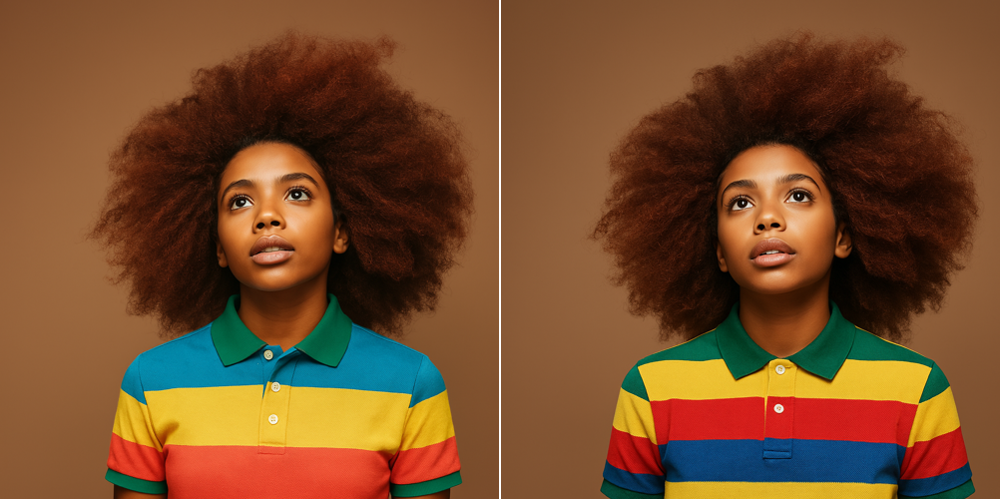

In [45]:
images_data = response.json()["data"]
encoded_images = [img["b64_json"] for img in images_data]
display_images(encoded_images, width=500)